# Exploration of factors influencing students’ PISA scores in Thailand with Machine Learning approaches: Regression Models


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns 
from scipy import stats

from sklearn.linear_model import LinearRegression 
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, LassoCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, cross_val_score


import xgboost as xgb
from xgboost.sklearn import XGBRegressor

import xgboost as xg 
from sklearn.ensemble import RandomForestRegressor
from sklearn import svm
from sklearn.linear_model import LinearRegression
# Feature Importance 
import shap
from sklearn.inspection import PartialDependenceDisplay

In [2]:
#Import main data file
pisa2018_thailand = pd.read_csv('datasets/pisa2018_thailand.csv')

In [3]:
pisa2018_thailand.head()

,CNTRYID,CNTSCHID,CNTSTUID,STRATUM,EFFORT1,EFFORT2,OCOD1,OCOD2,OCOD3,GRADE,...,UNIT,WVARSTRR,SENWT,VER_DAT,test,GENDER,MATH,SCIENCE,READ,TOTALSCORE
0,Thailand,76400001.0,76400028.0,Undisclosed STRATUM - Thailand,10.0,6.0,Housewife,Retail and wholesale trade managers,Applications programmers,0.0,...,final variance unit 2,7.0,0.04674,30APR19:15:04:17,NaN,1,606.0296,515.3353,477.3303,532.898400
1,Thailand,76400001.0,76400053.0,Undisclosed STRATUM - Thailand,9.0,8.0,Cooks,Sales and marketing managers,Missing,0.0,...,final variance unit 2,64.0,0.04674,30APR19:15:04:17,NaN,1,562.2686,508.3563,514.8449,528.489933
2,Thailand,76400001.0,76400266.0,Undisclosed STRATUM - Thailand,10.0,10.0,Bank tellers and related clerks,Retail and wholesale trade managers,Retail and wholesale trade managers,0.0,...,final variance unit 2,2.0,0.04674,30APR19:15:04:17,NaN,1,500.9725,504.6400,467.6045,491.072333
3,Thailand,76400001.0,76400751.0,Undisclosed STRATUM - Thailand,9.0,10.0,Accountants,Police officers,Generalist medical practitioners,0.0,...,final variance unit 1,64.0,0.04674,30APR19:15:04:17,NaN,1,509.4624,517.7330,484.8153,504.003567
4,Thailand,76400001.0,76401297.0,Undisclosed STRATUM - Thailand,8.0,10.0,Housewife,Police officers,Engineering professionals not elsewhere classi...,0.0,...,final variance unit 1,30.0,0.04487,30APR19:15:04:17,NaN,0,586.2431,587.1336,535.4648,569.613833


In [4]:
#Import additional data file
pisa2018_thailand_extra = pd.read_csv('datasets/PISA2018_THA_Datafile_extra.csv')

In [5]:
pisa2018_thailand_extra.head(5)

,CNTSTUID,SCHLTYPE,STRATIO,SCHSIZE,RATCMP1,RATCMP2,TOTAT,PROATCE,PROAT5AB,PROAT5AM,PROAT6,CLSIZE,CREACTIV,EDUSHORT,STAFFSHORT,STUBEHA,TEACHBEHA,SCMCEG
0,76400028,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
1,76400053,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
2,76400266,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
3,76400751,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
4,76401297,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542


In [6]:
pisa2018_thailand_extra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8633 entries, 0 to 8632
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   CNTSTUID    8633 non-null   int64  
 1   SCHLTYPE    8633 non-null   int64  
 2   STRATIO     8633 non-null   float64
 3   SCHSIZE     8633 non-null   int64  
 4   RATCMP1     8633 non-null   float64
 5   RATCMP2     8633 non-null   float64
 6   TOTAT       8633 non-null   float64
 7   PROATCE     8633 non-null   float64
 8   PROAT5AB    8633 non-null   float64
 9   PROAT5AM    8633 non-null   float64
 10  PROAT6      8633 non-null   float64
 11  CLSIZE      8633 non-null   int64  
 12  CREACTIV    8633 non-null   int64  
 13  EDUSHORT    8633 non-null   float64
 14  STAFFSHORT  8633 non-null   float64
 15  STUBEHA     8633 non-null   float64
 16  TEACHBEHA   8633 non-null   float64
 17  SCMCEG      8633 non-null   float64
dtypes: float64(13), int64(5)
memory usage: 1.2 MB


In [7]:
#Check simple statistics
pisa2018_thailand_extra.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
CNTSTUID,8633.0,76404562.18,2627.40,76400001.00,76402292.00,76404562.00,76406837.00,76409120.00
SCHLTYPE,8633.0,2.81,0.53,1.00,3.00,3.00,3.00,3.00
STRATIO,8633.0,35.76,129.17,1.00,14.69,18.14,21.02,999.00
SCHSIZE,8633.0,1762373.04,13152287.02,3.00,718.00,1405.00,2560.00,99999999.00
RATCMP1,8633.0,26.93,160.47,0.01,0.21,0.33,0.56,999.00
RATCMP2,8633.0,56.21,228.27,0.00,1.00,1.00,1.00,999.00
TOTAT,8633.0,106.77,231.89,0.00,44.00,76.50,130.00,3334.50
PROATCE,8633.0,0.88,0.24,0.00,0.90,0.98,1.00,1.00
PROAT5AB,8633.0,0.63,0.23,0.00,0.49,0.64,0.79,1.00
PROAT5AM,8633.0,0.36,0.19,0.00,0.22,0.36,0.49,0.88


In [8]:
#According summary of simple statistic, the database represents missing values as 9, 99, 999, 9999, or 9999999. 
#Thus, theses vakues will be replaced as NAN.
pisa2018_thailand_extra= pisa2018_thailand_extra.replace('', np.nan)
for col in pisa2018_thailand_extra.columns:
    if pisa2018_thailand_extra[col].max() == 9:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 9 else x)
    elif pisa2018_thailand_extra[col].max() == 99:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 99 else x)
    elif pisa2018_thailand_extra[col].max() == 999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 999 else x)
    elif pisa2018_thailand_extra[col].max() == 9999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 9999 else x)
    elif pisa2018_thailand_extra[col].max() == 99999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 99999 else x)
    elif pisa2018_thailand_extra[col].max() == 999999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 999999 else x)
    elif pisa2018_thailand_extra[col].max() == 9999999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 9999999 else x)
    elif pisa2018_thailand_extra[col].max() == 99999999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 99999999 else x)

In [9]:
#Join main data file with additional data
pisa2018_thailand = pisa2018_thailand.merge(pisa2018_thailand_extra, how='left', on='CNTSTUID')

In [10]:
pisa2018_thailand.shape

(8633, 146)

In [11]:
pisa2018_thailand.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8633 entries, 0 to 8632
Columns: 146 entries, CNTRYID to SCMCEG
dtypes: float64(112), int64(4), object(30)
memory usage: 9.7+ MB


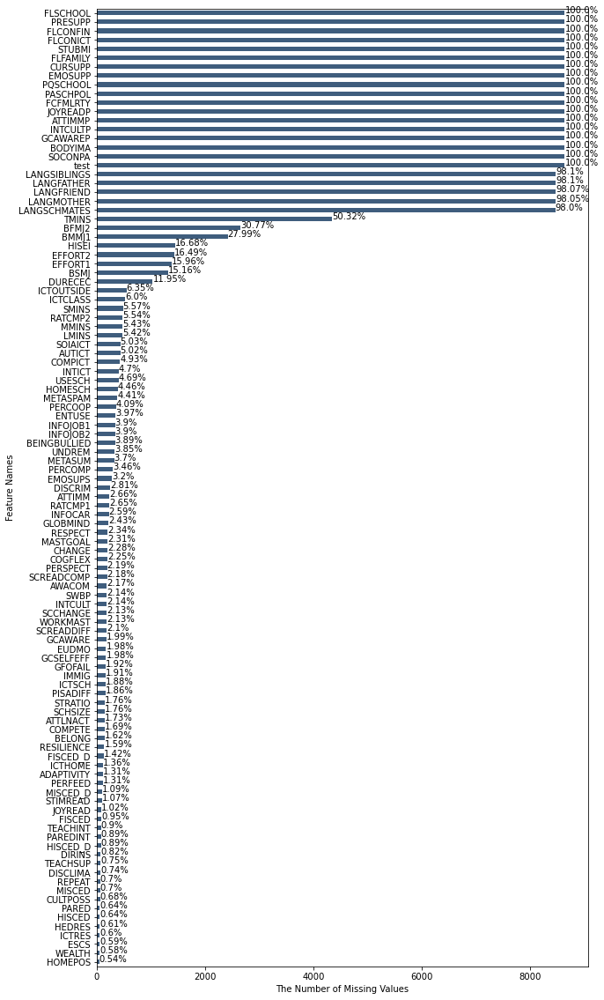

In [16]:
#Check percentage of null values

Nan = pisa2018_thailand.isnull().sum()[pisa2018_thailand.isnull().sum()>0]

Nan.sort_values().plot(kind='barh', figsize=(10, 20), color = "#3F5D7D");

for y, x in enumerate(Nan.sort_values()):
    
    plt.annotate(str(round(x/pisa2018_thailand.shape[0]*100,2))+'%', xy=(x, y), size=10)
    
plt.xlabel('The Number of Missing Values')

plt.ylabel('Feature Names');

In [12]:
#Drop column with NAN more than 10%
NanPer = len(pisa2018_thailand) *.90
pisa2018_thailand = pisa2018_thailand.dropna(thresh=NanPer, axis=1)

In [13]:
#Split data into train and test
train_thailand , test_thailand  = train_test_split(pisa2018_thailand, test_size=0.2, random_state=42)

print(f"No. of training examples: {train_thailand.shape[0]}")
print(f"No. of testing examples: {test_thailand.shape[0]}")

No. of training examples: 6906
No. of testing examples: 1727


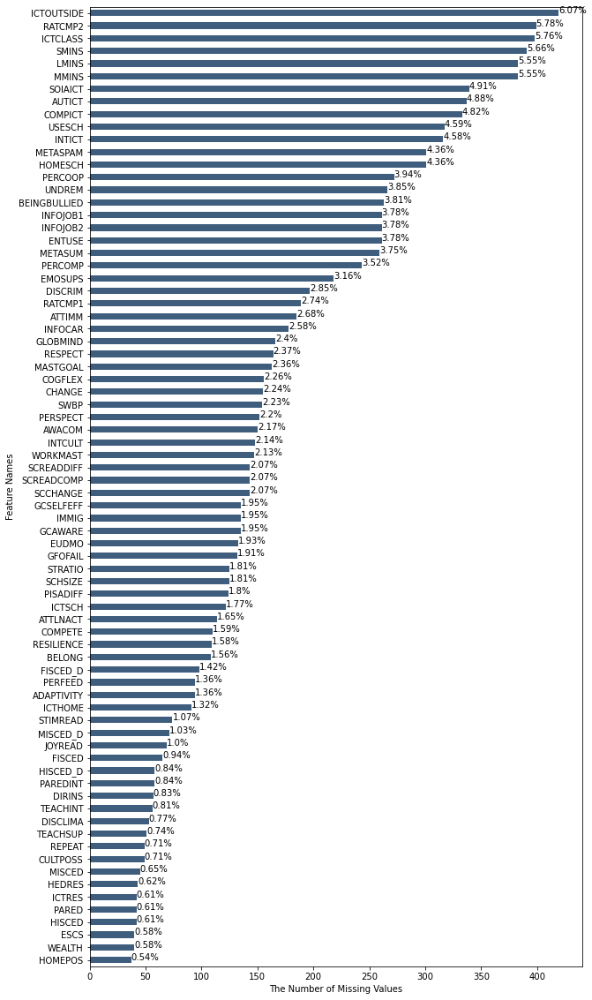

In [14]:
#Checking percentage of null values

Nan = train_thailand.isnull().sum()[train_thailand.isnull().sum()>0]

Nan.sort_values().plot(kind='barh', figsize=(10, 20), color = "#3F5D7D");

for y, x in enumerate(Nan.sort_values()):
    
    plt.annotate(str(round(x/train_thailand.shape[0]*100,2))+'%', xy=(x, y), size=10)
    
plt.xlabel('The Number of Missing Values')

plt.ylabel('Feature Names');

In [15]:
#change data type
train_thailand['GENDER'] = train_thailand['GENDER'].astype('object')
train_thailand['SCHLTYPE'] = train_thailand['SCHLTYPE'].astype('object')
test_thailand['GENDER'] = test_thailand['GENDER'].astype('object')
test_thailand['SCHLTYPE'] = test_thailand['SCHLTYPE'].astype('object')

In [16]:
#Fill NAN values with train columns' median
numvar = train_thailand.dtypes !="object"
numeric_features = list(numvar[numvar].index)
for col in numeric_features:
    train_thailand[col].fillna(train_thailand[col].median(), inplace=True)
    test_thailand[col].fillna(train_thailand[col].median(), inplace=True)

In [17]:
#Fill NAN values with train columns' mode
obvar = train_thailand.dtypes =="object"
categorical_features = list(obvar[obvar].index)
for col in categorical_features:
    train_thailand[col].fillna(train_thailand[col].mode()[0], inplace=True)
    test_thailand[col].fillna(train_thailand[col].mode()[0], inplace=True)

In [25]:
train_thailand.isnull().sum().sum(),test_thailand.isnull().sum().sum()

(0, 0)

In [26]:
list(train_thailand.columns)

['CNTRYID',
 'CNTSCHID',
 'CNTSTUID',
 'STRATUM',
 'OCOD1',
 'OCOD2',
 'OCOD3',
 'GRADE',
 'AGE',
 'PROGN',
 'COBN_S',
 'COBN_M',
 'COBN_F',
 'LANGN',
 'ISCEDL',
 'ISCEDD',
 'ISCEDO',
 'MISCED',
 'FISCED',
 'HISCED',
 'PARED',
 'MISCED_D',
 'FISCED_D',
 'HISCED_D',
 'PAREDINT',
 'IMMIG',
 'REPEAT',
 'MMINS',
 'LMINS',
 'SMINS',
 'SCCHANGE',
 'CHANGE',
 'ESCS',
 'UNDREM',
 'METASUM',
 'METASPAM',
 'ICTHOME',
 'ICTSCH',
 'HOMEPOS',
 'CULTPOSS',
 'HEDRES',
 'WEALTH',
 'ICTRES',
 'DISCLIMA',
 'TEACHSUP',
 'DIRINS',
 'PERFEED',
 'EMOSUPS',
 'STIMREAD',
 'ADAPTIVITY',
 'TEACHINT',
 'JOYREAD',
 'SCREADCOMP',
 'SCREADDIFF',
 'PISADIFF',
 'PERCOMP',
 'PERCOOP',
 'ATTLNACT',
 'COMPETE',
 'WORKMAST',
 'GFOFAIL',
 'EUDMO',
 'SWBP',
 'RESILIENCE',
 'MASTGOAL',
 'GCSELFEFF',
 'GCAWARE',
 'ATTIMM',
 'INTCULT',
 'PERSPECT',
 'COGFLEX',
 'RESPECT',
 'AWACOM',
 'GLOBMIND',
 'DISCRIM',
 'BELONG',
 'BEINGBULLIED',
 'ENTUSE',
 'HOMESCH',
 'USESCH',
 'INTICT',
 'COMPICT',
 'AUTICT',
 'SOIAICT',
 'ICTCLASS',

In [18]:
#Set CNTSTUID as index
train_thailand.set_index('CNTSTUID', inplace=True)
test_thailand.set_index('CNTSTUID', inplace=True)

In [19]:
# Drop unused columns
train_thailand.drop(columns=['CNTRYID','CNTSCHID','STRATUM','OCOD1','OCOD2','OCOD3','PROGN','COBN_S',
                                'COBN_M','COBN_F','LANGN','UNIT', 'VER_DAT', 'SENWT'], axis =1, inplace = True)
test_thailand.drop(columns=['CNTRYID','CNTSCHID','STRATUM','OCOD1','OCOD2','OCOD3','PROGN','COBN_S',
                                'COBN_M','COBN_F','LANGN','UNIT', 'VER_DAT', 'SENWT'], axis =1, inplace = True)

In [29]:
train_thailand.shape, test_thailand.shape

((6906, 102), (1727, 102))

## Exploring numerical variables

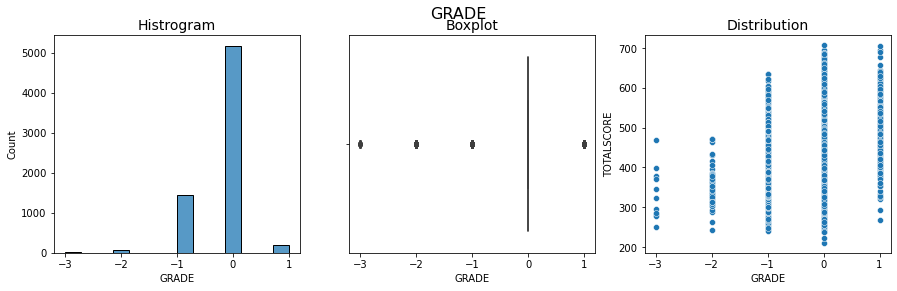

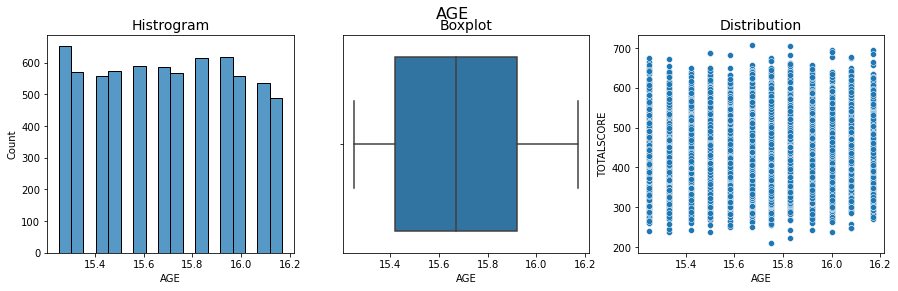

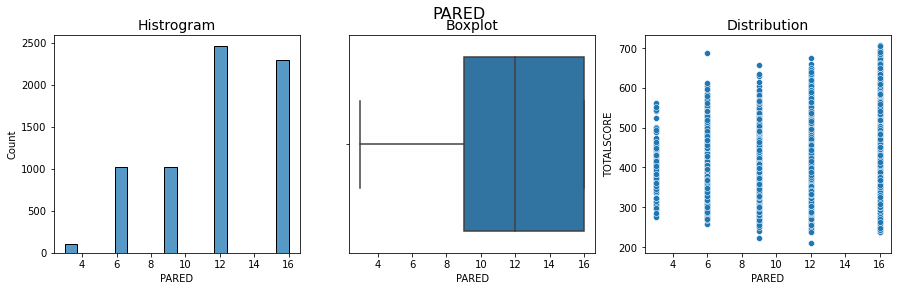

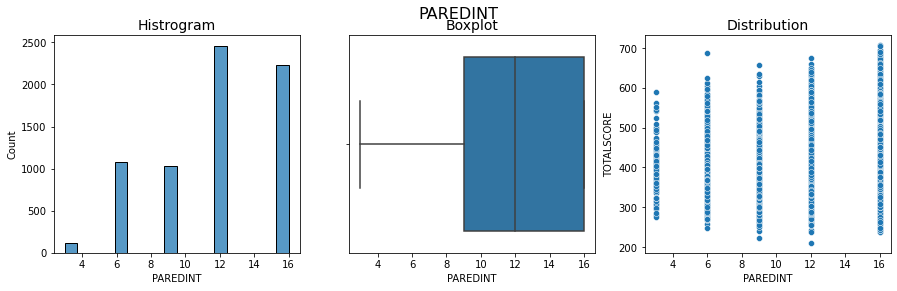

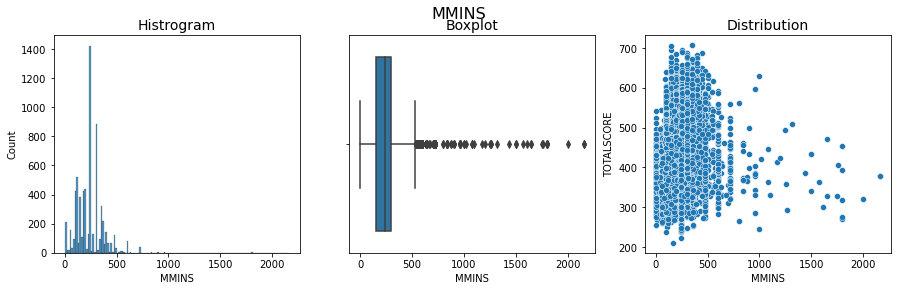

...

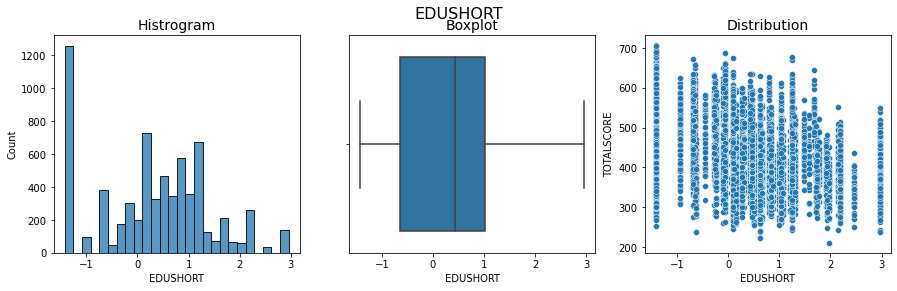

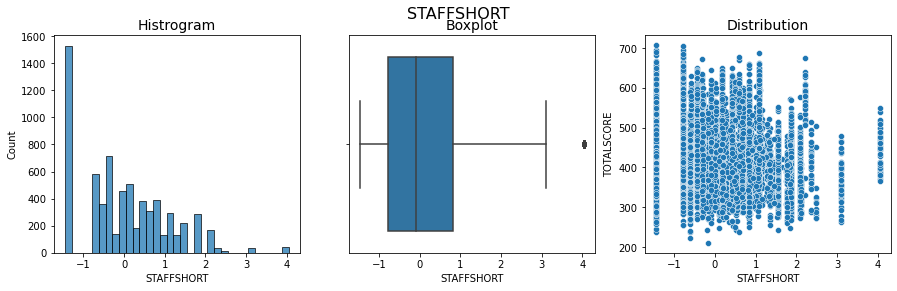

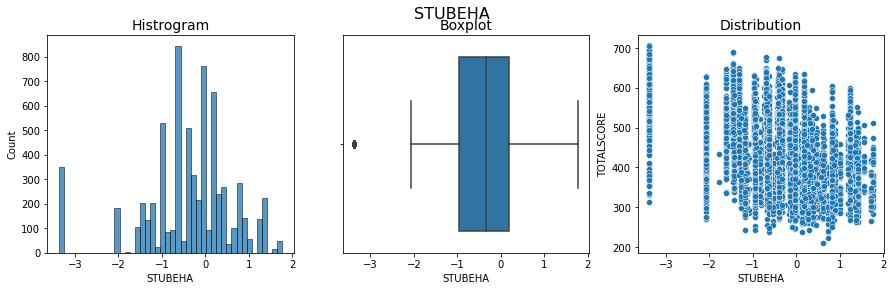

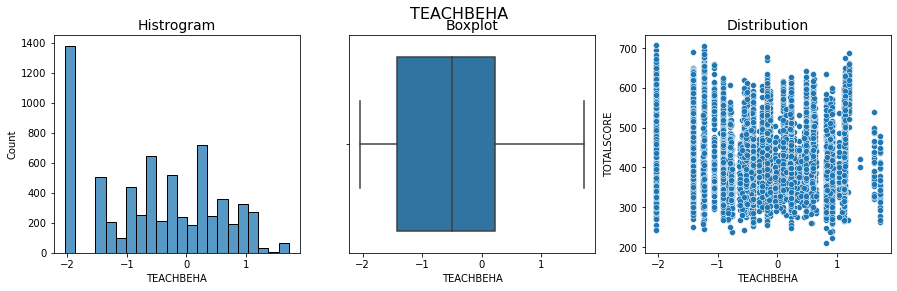

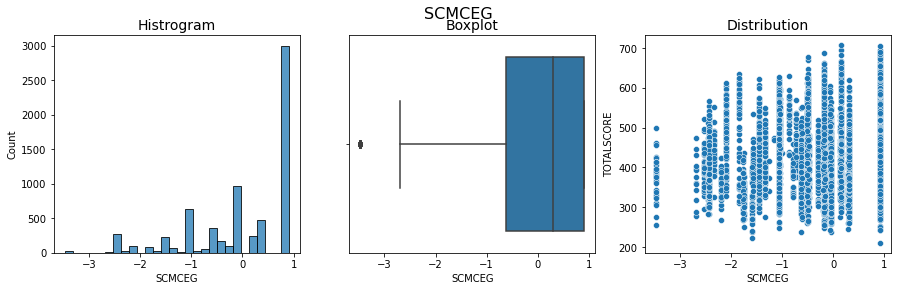

In [20]:
#Create Histrogram plot, Boxplot and Distribution plot of numerical features
numvar = train_thailand.dtypes !="object"
numeric_features = list(numvar[numvar].index)
for col in numeric_features:
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,4))
    ax = ax.ravel() 
    fig.suptitle(f"{col}\n", fontsize=16)
    ax[0].set_title(f'Histrogram', fontsize =14)
    sns.histplot(train_thailand[col], ax=ax[0])
    ax[1].set_title(f'Boxplot', fontsize =14)
    sns.boxplot(x=train_thailand[col], ax=ax[1])
    ax[2].set_title(f'Distribution', fontsize =14)
    sns.scatterplot(x = train_thailand[col], y= train_thailand['TOTALSCORE'],ax=ax[2])
    plt.show()

In [21]:
#remove extreme outliers
train_thailand = train_thailand[(train_thailand['MMINS'] < 2000)]
train_thailand = train_thailand[(train_thailand['LMINS'] < 2000)]
train_thailand = train_thailand[(train_thailand['SMINS'] < 2000)]
train_thailand = train_thailand[(train_thailand['CHANGE'] < 6)]
train_thailand = train_thailand[(train_thailand['CHANGE'] > -4)]
train_thailand = train_thailand[(train_thailand['HOMEPOS'] > -6)]
train_thailand = train_thailand[(train_thailand['TEACHSUP'] > -3)]
train_thailand = train_thailand[(train_thailand['JOYREAD'] > -2)]
train_thailand = train_thailand[(train_thailand['PERSPECT'] > -3)]
train_thailand = train_thailand[(train_thailand['TOTAT'] < 1000)]

In [22]:
train_thailand.shape, test_thailand.shape

((6775, 100), (1727, 100))

## Exploring categorical features

In [23]:
# Create a function to plot boxplot for categorical features

def subplot_boxplot(dataframe, list_of_columns):
    
    nrows = int(np.ceil(len(list_of_columns)/2)) 
    
    fig, ax = plt.subplots(nrows=nrows, ncols=2, figsize=(15,5*nrows)) 
    
    ax = ax.ravel() 
    
    if len(list_of_columns) %2 !=0:
        
        ax[len(list_of_columns)].set_visible(False)
        
    for i, column in enumerate(list_of_columns):
        
        names = train_thailand.groupby(column).mean()['TOTALSCORE'].sort_values().index
        
        sns.boxplot(x = dataframe[column],y = dataframe['TOTALSCORE'],order = names, ax = ax[i], color="#99d6ff") 
        
        ax[i].set_title(f'TOTALSCORE  vs {column}', fontsize =16)
        
        ax[i].set_ylabel('Values',fontsize=15)
        
        ax[i].set_xlabel(column,fontsize=15) 
        
        ax[i].set_xticklabels(names,rotation=40) 
        
    plt.tight_layout()

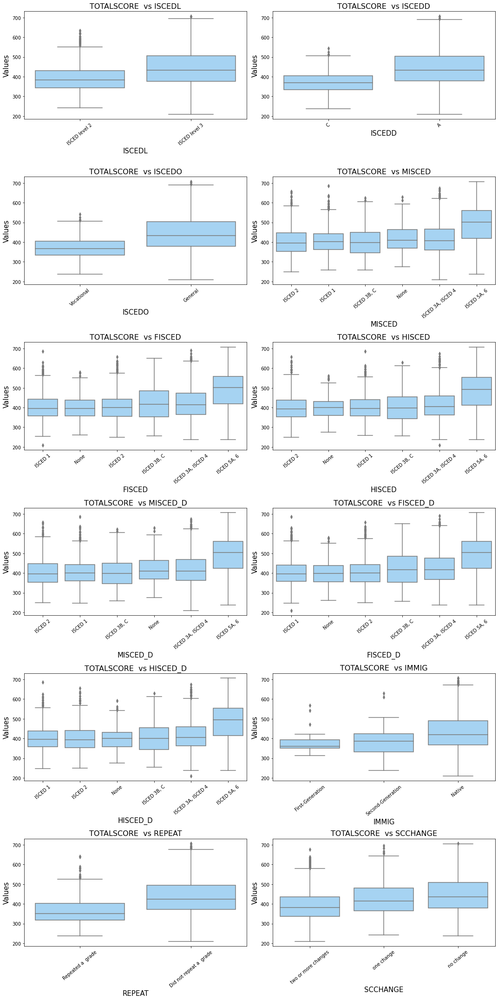

In [24]:
#Create boxplot
obvar = train_thailand.dtypes =="object"
categorical_features = list(obvar[obvar].index) 
subplot_boxplot(train_thailand, categorical_features)

According to the boxplots, some features has duplicated information. Moreover, the subgroup of 'MISCED', 'FISCED', 'HISCED' have similar means except 'ISCED 5A, 6', Thus, all subgroup will be combined into one group to reduce number of dummy codes. 

In [25]:
#Drop duplicated features 
train_thailand.drop(columns=['MISCED_D', 'FISCED_D', 'HISCED_D', 'ISCEDD' ], axis =1, inplace = True)
test_thailand.drop(columns=['MISCED_D', 'FISCED_D', 'HISCED_D', 'ISCEDD'], axis =1, inplace = True)

In [26]:
# grouping values of categorical columns to reduce number of categories. 
train_thailand['Is_MISCED_5A,6'] = np.where(train_thailand['MISCED'] == 'ISCED 5A, 6', 1, 0)
train_thailand['Is_FISCED_5A,6'] = np.where(train_thailand['FISCED'] == 'ISCED 5A, 6', 1, 0)
train_thailand['Is_HISCED_5A,6'] = np.where(train_thailand['HISCED'] == 'ISCED 5A, 6', 1, 0)

In [27]:
# grouping values of categorical columns to reduce number of categories. 
test_thailand['Is_MISCED_5A,6'] = np.where(test_thailand['MISCED'] == 'ISCED 5A, 6', 1, 0)
test_thailand['Is_FISCED_5A,6'] = np.where(test_thailand['FISCED'] == 'ISCED 5A, 6', 1, 0)
test_thailand['Is_HISCED_5A,6'] = np.where(test_thailand['HISCED'] == 'ISCED 5A, 6', 1, 0)

In [28]:
#drop original columns
train_thailand.drop(columns= ['MISCED', 'FISCED', 'HISCED'], axis =1, inplace =True)
test_thailand.drop(columns= ['MISCED', 'FISCED', 'HISCED'], axis =1, inplace =True)

## Explore relationship among features

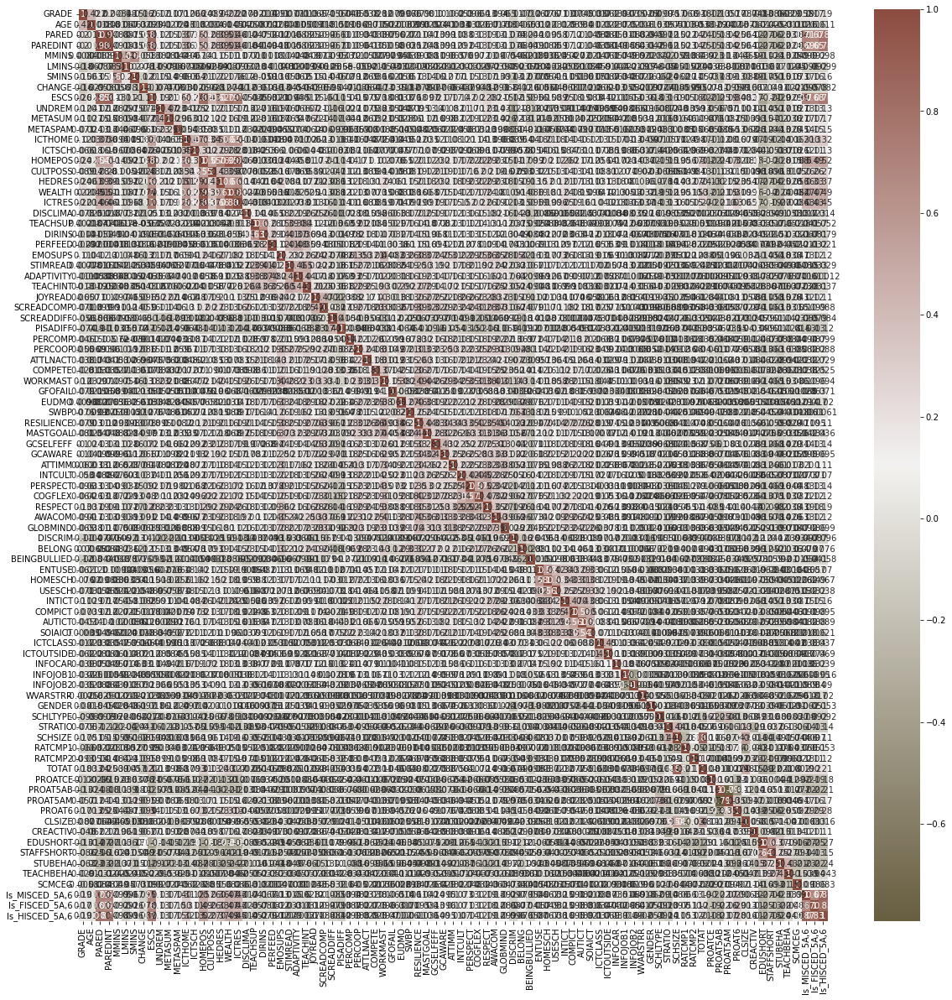

In [30]:
#Checking collinearity using correlation matrix
train_thailand_cormatrix = train_thailand.drop(columns= ['MATH','SCIENCE','READ','TOTALSCORE',], axis =1)
cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
corrmat= train_thailand_cormatrix.corr()
f, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrmat,cmap=cmap,annot=True);

In [34]:
# Drop columns with high correlation 
#Create correlation matrix
corr_matrix = train_thailand_cormatrix.corr().abs()
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print(f' Features to drop : {to_drop}')

 Features to drop : ['PAREDINT', 'WEALTH']


In [44]:
# Drop features with high correlation among themselves
train_thailand.drop(to_drop, axis=1, inplace=True)
test_thailand.drop(to_drop, axis=1, inplace=True)
train_thailand.shape, test_thailand.shape

((6775, 96), (1727, 96))

## Exploring target variables

In [35]:
train_thailand[['MATH','READ', 'SCIENCE','TOTALSCORE']].describe().round(2)

,MATH,READ,SCIENCE,TOTALSCORE
count,6775.00,6775.00,6775.00,6775.00
mean,439.87,410.48,445.49,431.95
std,94.21,85.92,86.78,85.67
min,152.93,204.76,192.08,210.01
25%,369.89,346.09,380.32,367.62
50%,426.96,401.22,436.46,419.66
75%,498.87,469.08,506.19,489.41
max,772.24,681.54,705.10,707.02


<Figure size 432x432 with 0 Axes>

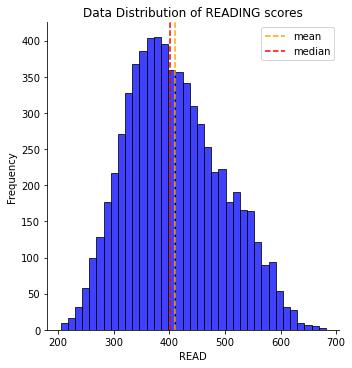

In [36]:
#Check data distribution of READING scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['READ'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of READING scores')

plt.axvline(train_thailand['READ'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['READ'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();


<Figure size 432x432 with 0 Axes>

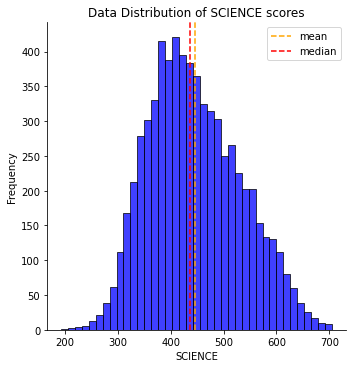

In [38]:
#Check data distribution of SCIENCE scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['SCIENCE'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of SCIENCE scores')

plt.axvline(train_thailand['SCIENCE'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['SCIENCE'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();

<Figure size 432x432 with 0 Axes>

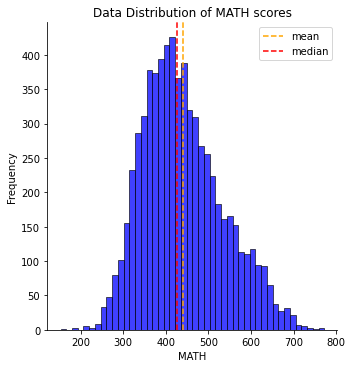

In [37]:
#Check data distribution of MATH scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['MATH'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of MATH scores')

plt.axvline(train_thailand['MATH'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['MATH'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();

<Figure size 432x432 with 0 Axes>

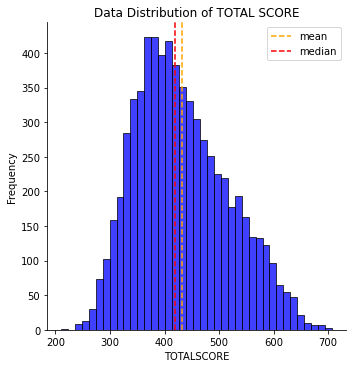

In [50]:
#Check data distribution of TOTALSCORE
plt.figure(figsize=(6,6))

sns.displot(train_thailand['TOTALSCORE'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of TOTAL SCORE')

plt.axvline(train_thailand['TOTALSCORE'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['TOTALSCORE'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();

All 'MATH','READ', 'SCIENCE', and 'TOTALSCORE' scores are slightly left skew. Average score of SCIENCE is highest, while average score of READING is the lowest. In this study, TOTALSCORE will be the main target. 

## Exploring correlations between features and the target variable

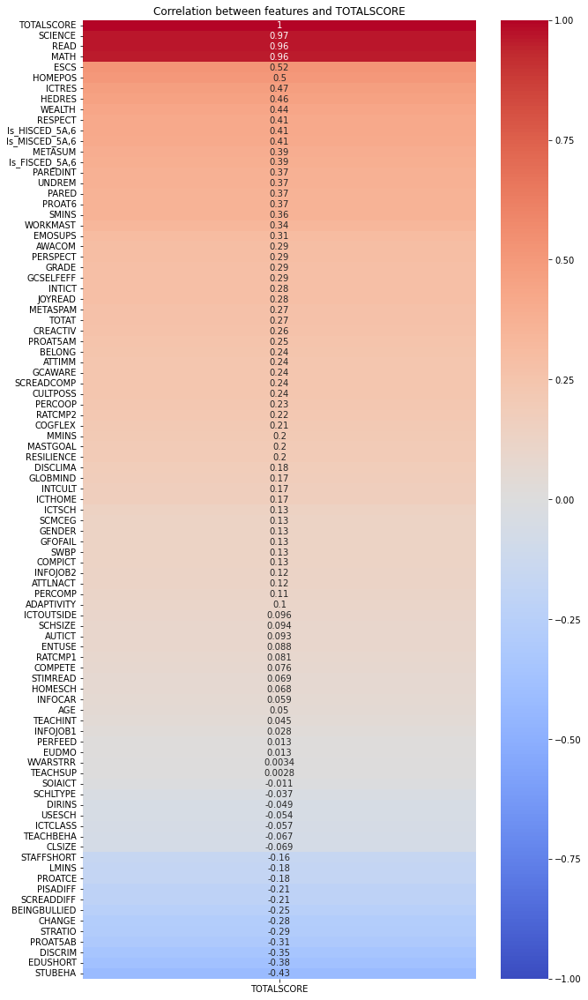

In [40]:
#Heatmap of correlation between features and TOTALSCORE
plt.figure(figsize = (10,20))
sns.heatmap(train_thailand.corr()[['TOTALSCORE']].sort_values(by = 'TOTALSCORE', ascending = False), 
                cmap = 'coolwarm',
                vmax = 1,
                vmin = -1,
                annot = True)
plt.title('Correlation between features and TOTALSCORE')

plt.yticks(rotation =0)
plt.show()

Due to too many features in building a model in this dataset, and the aim of this study is to explore features that impact PISA score. Thus, only features whcih have higher correlation with the target variable will be used in the models. 

In [53]:
#Select features which have correlation above 0.25 or below -0.25 
selectd_features = (train_thailand.corr()[['TOTALSCORE']] > 0.25) | (train_thailand.corr()[['TOTALSCORE']] < -0.25)
selectd_features[selectd_features['TOTALSCORE']==True].index.values

array(['GRADE', 'PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT', 'MATH', 'SCIENCE', 'READ', 'TOTALSCORE',
       'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6', 'CREACTIV',
       'EDUSHORT', 'STUBEHA', 'Is_MISCED_5A,6', 'Is_FISCED_5A,6',
       'Is_HISCED_5A,6'], dtype=object)

In [41]:
obvar = train_thailand.dtypes =="object"
categorical_features = list(obvar[obvar].index) 
categorical_features

['ISCEDL', 'ISCEDO', 'IMMIG', 'REPEAT', 'SCCHANGE']

In [54]:
#Save files for another study.
train_thailand.to_csv('train_pisa2018_thailand.csv')
test_thailand.to_csv('test_pisa2018_thailand.csv')

# Building Regressor Models

In [46]:
#Assemble our X and y variables
X_train =train_thailand[['GRADE', 'PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT',  'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6',
       'CREACTIV','EDUSHORT', 'STUBEHA', 'Is_MISCED_5A,6', 'Is_FISCED_5A,6',
       'Is_HISCED_5A,6', 'ISCEDL','ISCEDO', 'IMMIG', 'REPEAT', 'SCCHANGE', 'GENDER','SCHLTYPE']]
X_train = pd.get_dummies(columns=['Is_MISCED_5A,6', 'Is_FISCED_5A,6','Is_HISCED_5A,6', 'ISCEDL','ISCEDO', 
                                  'IMMIG', 'REPEAT', 'SCCHANGE', 'GENDER','SCHLTYPE'], drop_first =True, data =X_train)
y_train = train_thailand['TOTALSCORE']

X_test =test_thailand[['GRADE', 'PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT',  'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6',
       'CREACTIV','EDUSHORT', 'STUBEHA', 'Is_MISCED_5A,6', 'Is_FISCED_5A,6',
       'Is_HISCED_5A,6', 'ISCEDL','ISCEDO', 'IMMIG', 'REPEAT', 'SCCHANGE', 'GENDER','SCHLTYPE']]
X_test = pd.get_dummies(columns=['Is_MISCED_5A,6', 'Is_FISCED_5A,6','Is_HISCED_5A,6', 'ISCEDL','ISCEDO', 
                                  'IMMIG', 'REPEAT', 'SCCHANGE', 'GENDER','SCHLTYPE'], drop_first =True, data =X_test)
y_test = test_thailand['TOTALSCORE']

## Dummy Regressor model

In [47]:
from sklearn.dummy import DummyRegressor
baseline_model = DummyRegressor()
baseline_model.fit(X_train, y_train)
baseline_preds = baseline_model.predict(X_test)
# Test Score
baseline_model.score(X_test, y_test)
print(f'Test R-squared Score: {baseline_model.score(X_test, y_test)}')
#evaluate models with matrics
print(f'MSE is : {mean_squared_error(y_test, baseline_preds)}' )
print(f'RMSE is : {mean_squared_error(y_test, baseline_preds, squared = False)}' )

Test R-squared Score: -0.0010390229006635998
MSE is : 7168.110059264057
RMSE is : 84.66469192800537


## Linear Regression model

In [48]:
lr = LinearRegression()
lr.fit(X_train, y_train)

# Train Score
lr.score(X_train, y_train)
print(f'Train R-squared Score: {lr.score(X_train, y_train)}')
print()

# Test Score
lr.score(X_test, y_test)
print(f'Test R-squared Score: {lr.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(lr, X_train, y_train, cv =5)
print(f' Cross Val Score :{cross_val_score(lr, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = lr.predict(X_test)

#evaluate models with matrics
print(f'MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )

Train R-squared Score: 0.6448675946965585

Test R-squared Score: 0.5741638341144555
 Cross Val Score :[0.62114543 0.64236318 0.63506506 0.66125501 0.63935212]

MSE is : 3049.272240594274
RMSE is : 55.220215868776485


In [49]:
lr.intercept_

523.488821658543

In [50]:
pd.Series(lr.coef_, index = X_train.columns).sort_values(ascending=False)

PROAT6                          274.372418
ESCS                             17.887797
GRADE                            16.375361
Is_HISCED_5A,6_1                 12.243382
METASUM                           8.206740
RESPECT                           7.704213
METASPAM                          7.507212
ICTRES                            7.216434
UNDREM                            7.074656
SCHLTYPE_3                        6.470780
INTICT                            5.778105
Is_MISCED_5A,6_1                  5.383971
GCSELFEFF                         5.112038
WORKMAST                          4.470093
Is_FISCED_5A,6_1                  3.660705
JOYREAD                           3.511282
HEDRES                            3.386042
CREACTIV                          2.339104
AWACOM                            1.871997
SCCHANGE_one change               0.607780
GENDER_1                          0.471134
TOTAT                             0.109047
SMINS                             0.039099
EMOSUPS    

#### Getting stadardized coefficients

In [51]:
scaler = StandardScaler()  #scaler object
X_train_sc = scaler.fit_transform(X_train)  #scaling training set
X_test_sc = scaler.transform(X_test)  #scaling test set

lr = LinearRegression()
lr.fit(X_train_sc, y_train)
y_preds = lr.predict(X_test_sc)

In [52]:
# coefficient dataframe
lr_coef = pd.DataFrame(data=[lr.coef_],columns=X_train.columns).T.sort_values(by=0,ascending=False)

# Label the color the each coefficient
color = ['red' if x < 0 else 'blue' for x in lr_coef[0]]

# Assign the color_list to new column
lr_coef['color'] = color

lr_coef.head()

,0,color
ESCS,22.229453,blue
SMINS,8.579285,blue
PROAT6,8.331723,blue
GRADE,8.073885,blue
METASUM,7.692601,blue


In [53]:
# Select the highest values whether negative or positive
abs(lr_coef[0]).sort_values(ascending=False)[:10].index

Index(['ESCS', 'PARED', 'STUBEHA', 'DISCRIM', 'HOMEPOS', 'SMINS', 'PROAT6',
       'GRADE', 'METASUM', 'ICTRES'],
      dtype='object')

Text(0.5, 1.0, 'Top 10 highest coefficient')

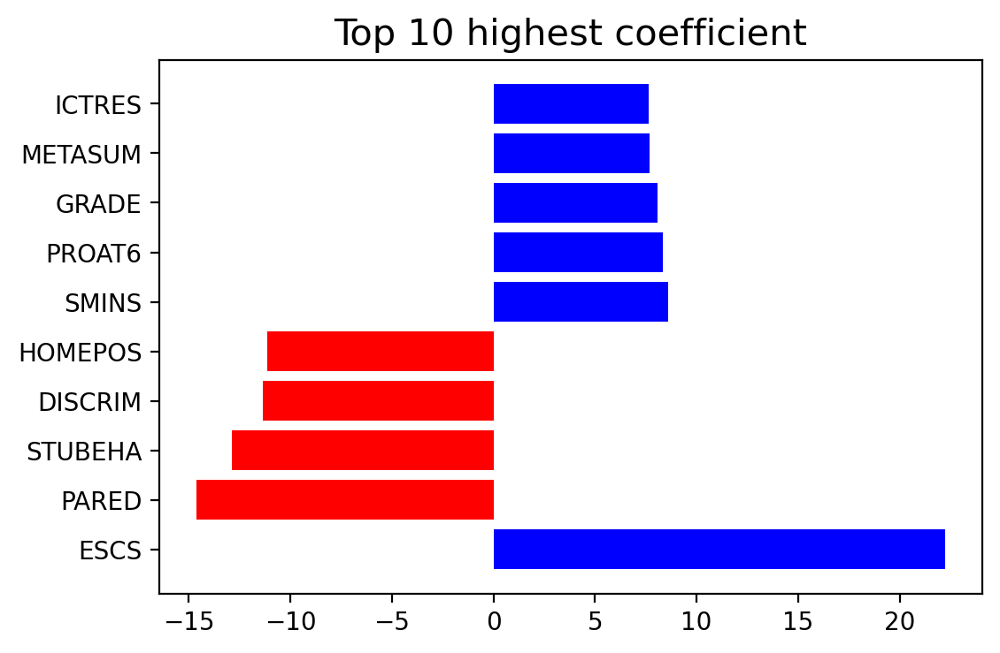

In [54]:
# Plot the coefficient of top 10 highest coefficient 
plt.figure(dpi=200)
plt.barh(lr_coef.loc[['ESCS', 'PARED', 'STUBEHA', 'DISCRIM', 'HOMEPOS', 'SMINS', 'PROAT6',
       'GRADE', 'METASUM', 'ICTRES']].index,lr_coef.loc[['ESCS', 'PARED', 'STUBEHA', 'DISCRIM', 'HOMEPOS', 'SMINS', 'PROAT6',
       'GRADE', 'METASUM', 'ICTRES']][0],color=lr_coef.loc[['ESCS', 'PARED', 'STUBEHA', 'DISCRIM', 'HOMEPOS', 'SMINS', 'PROAT6',
       'GRADE', 'METASUM', 'ICTRES']]['color'])
plt.title('Top 10 highest coefficient',size=15)

## Random Forest Regressor

In [56]:
parameters = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [2,3,4]
}
regr = RandomForestRegressor(random_state=42)

clf = GridSearchCV(regr, parameters)
clf.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestRegressor(random_state=42),
             param_grid={'max_depth': [2, 3, 4],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [57]:
clf.best_params_

{'max_depth': 4, 'n_estimators': 300}

In [58]:
clf.score(X_train, y_train)

0.5756881956113086

In [59]:
clf.score(X_test, y_test)

0.5160907236683089

In [60]:
# Making prediction
y_preds_clf = clf.predict(X_test)

#evaluate models with matrics
print(f'RFReg MSE is : {mean_squared_error(y_test, y_preds_clf)}' )
print(f'RFReg RMSE is : {mean_squared_error(y_test, y_preds_clf, squared = False)}' )

RFReg MSE is : 3465.114618002857
RFReg RMSE is : 58.86522418204875


In [73]:
clf.best_estimator_

RandomForestRegressor(max_depth=4, n_estimators=300, random_state=42)

In [74]:
pd.DataFrame(clf.cv_results_).sort_values('rank_test_score').head(5)[['params','param_max_depth','mean_test_score']]

,params,param_max_depth,mean_test_score
14,"{'max_depth': 4, 'n_estimators': 300}",4,0.556699
13,"{'max_depth': 4, 'n_estimators': 250}",4,0.556684
11,"{'max_depth': 4, 'n_estimators': 150}",4,0.556631
12,"{'max_depth': 4, 'n_estimators': 200}",4,0.556568
10,"{'max_depth': 4, 'n_estimators': 100}",4,0.556128


## Support Vector Mechine: SVM

In [61]:
#Building SVM model need standardized data
scaler = StandardScaler()

X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

#SVM
SVM = svm.SVR().fit(X_train_sc, y_train)
# Train Score
SVM.score(X_train_sc, y_train)
print(f'SVM Train R-squared Score: {SVM.score(X_train_sc, y_train)}')

# Test Score
SVM.score(X_test_sc, y_test)
print(f'SVM Test R-squared Score: {SVM.score(X_test_sc, y_test)}')

# Cross Val Score
cross_val_score(SVM, X_train_sc, y_train, cv =5)
print(f'SVM Cross Val Score :{cross_val_score(SVM, X_train_sc, y_train, cv =5)}')
print()
# Making prediction
y_preds = SVM.predict(X_test_sc)

#evaluate SVMs with matrics
print(f'SVM MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'SVM RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )

SVM Train R-squared Score: 0.5825366306784368
SVM Test R-squared Score: 0.5873065293357984
SVM Cross Val Score :[0.55421905 0.54546138 0.56805758 0.55424363 0.56664883]

SVM MSE is : 2955.161737739983
SVM RMSE is : 54.361399335741744


## XGboost regression model

In [62]:
xgb1 = XGBRegressor()
parameters = {'max_depth': [2,3,4,5],
              'subsample': [0.7, 1.0],
              'colsample_bytree': [0.7, 1.0],
              'n_estimators': [300, 500, 700]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 3,
                        n_jobs = 5,
                        verbose=True)

xgb_grid.fit(X_train,y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 3 folds for each of 48 candidates, totalling 144 fits
0.724331199742235
{'colsample_bytree': 1.0, 'max_depth': 2, 'n_estimators': 500, 'subsample': 1.0}


In [63]:
pd.DataFrame(xgb_grid.cv_results_).sort_values('rank_test_score').head(5)[['params','param_max_depth','mean_test_score']]

,params,param_max_depth,mean_test_score
27,"{'colsample_bytree': 1.0, 'max_depth': 2, 'n_e...",2,0.724331
25,"{'colsample_bytree': 1.0, 'max_depth': 2, 'n_e...",2,0.724130
3,"{'colsample_bytree': 0.7, 'max_depth': 2, 'n_e...",2,0.723668
1,"{'colsample_bytree': 0.7, 'max_depth': 2, 'n_e...",2,0.723166
29,"{'colsample_bytree': 1.0, 'max_depth': 2, 'n_e...",2,0.722325


In [65]:
#XGRegressor
XGReg2 = xg.XGBRegressor(max_depth = 2, n_estimators = 500, subsample = 1).fit(X_train, y_train) 
# Train Score
XGReg2.score(X_train, y_train)
print(f'XGReg2 Train R-squared Score: {XGReg2.score(X_train, y_train)}')
print()

# Test Score
XGReg2.score(X_test, y_test)
print(f'XGReg2 Test R-squared Score: {XGReg2.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(XGReg2, X_train, y_train, cv =5)
print(f'XGReg2 Cross Val Score :{cross_val_score(XGReg2, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = XGReg2.predict(X_test)

#evaluate models with matrics
print(f'XGReg2 MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'XGReg2 RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}')

XGReg2 Train R-squared Score: 0.8316106779670341

XGReg2 Test R-squared Score: 0.7216174249405853
XGReg2 Cross Val Score :[0.72515484 0.73215906 0.71221262 0.73555249 0.73938846]

XGReg2 MSE is : 1993.4057423905633
XGReg2 RMSE is : 44.64757263716095


Because XGB regressor performance is highest among the blackbox models, we will see how each features perform or explain the target varible using SHAP

In [70]:
#Explain the model's predictions using SHAP
explainer = shap.TreeExplainer(XGReg2)
shap_values = explainer.shap_values(X_train)

In [71]:
#Local explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

 97%|=================== | 6576/6775 [00:20<00:00]       

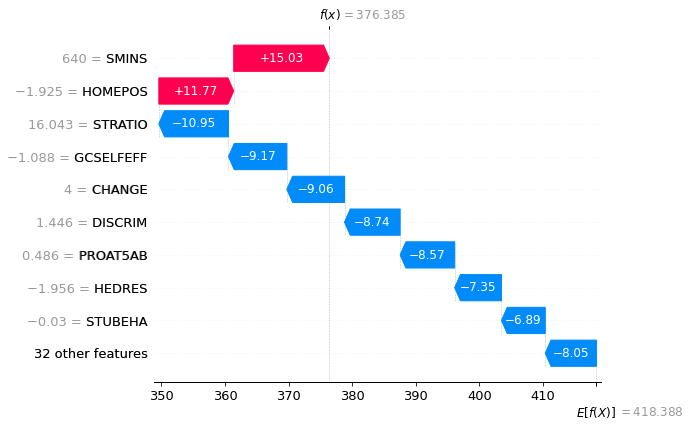

In [68]:
explainer = shap.Explainer(XGReg2, X_train)
shap_values = explainer(X_train)
shap.plots.waterfall(shap_values[100])

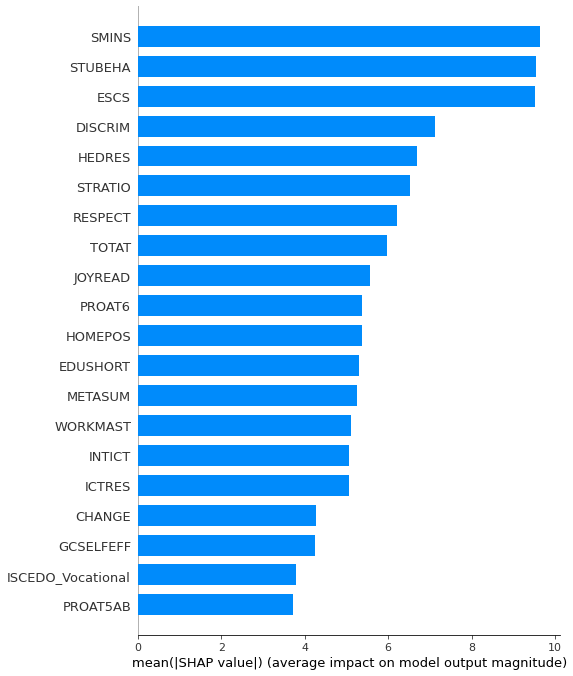

In [72]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

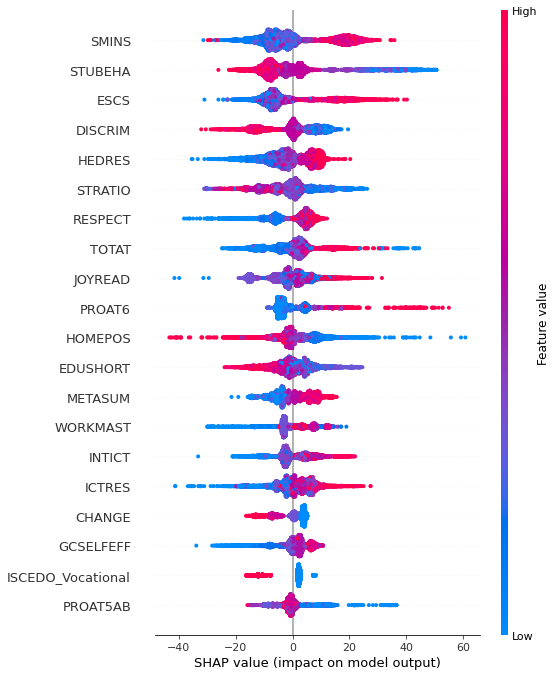

In [73]:
shap.summary_plot(shap_values, X_train)

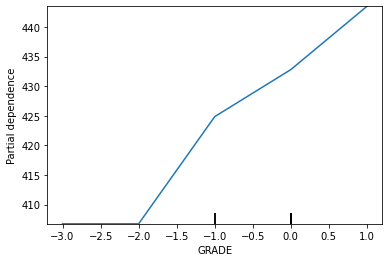

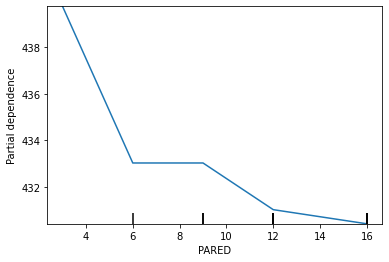

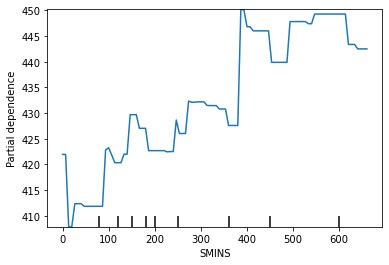

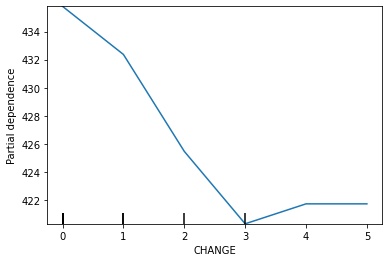

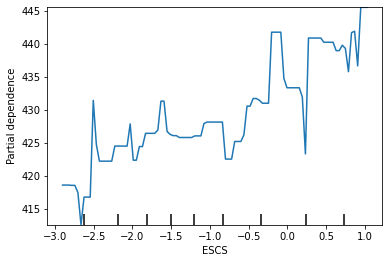

...

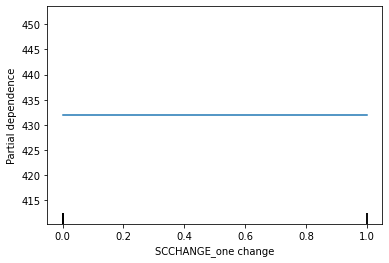

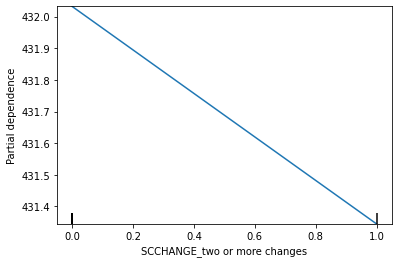

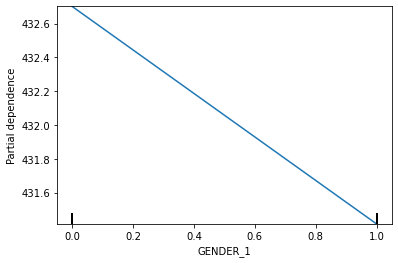

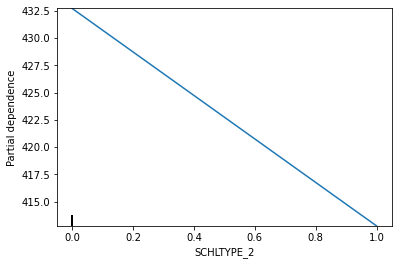

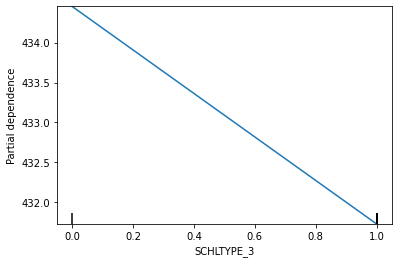

In [75]:
import warnings
warnings.filterwarnings("ignore")
#Generate Partial Dependence Plot
from sklearn.inspection import PartialDependenceDisplay
for cols_name in X_train.columns:
    PartialDependenceDisplay.from_estimator(XGReg2, X_train, [cols_name]);

## Explainable Boosting Regressor

In [76]:
#import interpretml 
from interpret import show
from interpret.data import Marginal
from interpret.glassbox import ExplainableBoostingRegressor, LinearRegression
from interpret.perf import RegressionPerf

In [77]:
lg = LinearRegression(random_state=42)
lg.fit(X_train, y_train)

lg_global = lg.explain_global()
show(lg_global)

<!-- http://127.0.0.1:7001/1999368905968/ -->

In [78]:
lg_perf = RegressionPerf(lg.predict).explain_perf(X_test, y_test, name='LinearRegression')
show(lg_perf)

<!-- http://127.0.0.1:7001/1999368973088/ -->

In [79]:
ebm = ExplainableBoostingRegressor(random_state=42, n_jobs=-1, feature_names = X_train.columns)
ebm.fit(X_train, y_train) 

ExplainableBoostingRegressor(feature_names=['GRADE', 'PARED', 'SMINS', 'CHANGE',
                                            'ESCS', 'UNDREM', 'METASUM',
                                            'METASPAM', 'HOMEPOS', 'HEDRES',
                                            'ICTRES', 'EMOSUPS', 'JOYREAD',
                                            'WORKMAST', 'GCSELFEFF', 'PERSPECT',
                                            'RESPECT', 'AWACOM', 'DISCRIM',
                                            'INTICT', 'STRATIO', 'TOTAT',
                                            'PROAT5AB', 'PROAT5AM', 'PROAT6',
                                            'CREACTIV', 'EDUSHORT', 'STUBEHA',
                                            'Is_MISCED_5A,6_1',
                                            'Is_FISCED_5A,6_...
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'categorical', 'categorical', ...],
                             n_jobs=-1)

In [80]:
ebm_global = ebm.explain_global(name='EBM')
show(ebm_global)

<!-- http://127.0.0.1:7001/1999363084144/ -->

In [81]:
ebm_perf = RegressionPerf(ebm.predict).explain_perf(X_test, y_test, name='EBM')
show(ebm_perf)

<!-- http://127.0.0.1:7001/1999368229840/ -->